In [12]:
import colorgram
from PIL import Image
import math
import colorsys

def get_concat_h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst
    
def get_concat_v(im1, im2):
    dst = Image.new('RGB', (im1.width, im1.height + im2.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (0, im1.height))
    return dst

def step (r,g,b, repetitions=1):
    lum = math.sqrt( .241 * r + .691 * g + .068 * b )
    h, s, v = colorsys.rgb_to_hsv(r,g,b)
    h2 = int(h * repetitions)
    lum2 = int(lum * repetitions)
    v2 = int(v * repetitions)
    if h2 % 2 == 1:
        v2 = repetitions - v2
        lum = repetitions - lum
    return (h2, lum2, v2)

def sort_tone(colors, length):
    tone_counter = 0
    change = 0
    for i in range(length):
        if i > 0 and colors[i].rgb.r < colors[i-1].rgb.r:
            tone_counter = tone_counter + 1
            change = i
    print(tone_counter)
    tmp = 0
    if int(tone_counter) == 1: 
        for i in range(change, int(change + (length - change)/2 + 1)):
            tmp = colors[i]
            colors[i] = colors[change + length - i -1]
            colors[change + length - i -1] = tmp
            
def print_colors(color):
    print(color)
    print(color.rgb.r + color.rgb.g + color.rgb.b)
    print(color.hsl.h)
    print(color.hsl.s)
    print(color.hsl.l)

In [13]:
#Dichiaro il percorso dell'immagine da analizzare
path = "Images/image2.png"
#path = input()
image = Image.open(path)

#Estraggo e calcolo le misure utili
width, height = image.size
white_sep_width = int(width/(11))
missing_px = width - ( white_sep_width*10 + 9 * int(white_sep_width/9))

#Estraggo i 10 colori più frequenti nell'immagine
colors = colorgram.extract(image, 10)

In [18]:
#Testo diversi metodi per sortare i colori

print("Inserisci 1, 2 o 3 per selezionare il sorting desiderato:")
choice = int(input())
    
if choice == 1:
    #Funzione a step
    colors = sorted(colors, key=lambda c: step(c.rgb.r, c.rgb.g, c.rgb.b, 8))

if choice == 2:
    #Combinazione lineare di h, s e l
    colors = sorted(colors, key=lambda c: c.hsl.s + c.hsl.l) 

if choice == 3:  
    #Combinazione lineare dei valori rgb
    colors = sorted(colors, key=lambda c: c.rgb.r + c.rgb.g + c.rgb.b)  
    
#Se la lista di colori ha due colori più scuri di tonalità diverse, creo una lista a due toni        
#sort_tone(colors, len(colors))

Inserisci 1, 2 o 3 per selezionare il sorting desiderato:
3


In [19]:
from sys import argv
from math import log, ceil
import functools as ft


def int_to_Hilbert( i, nD=2 ):  # Default is the 2D Hilbert walk.
    index_chunks = unpack_index( i, nD )
    nChunks = len( index_chunks )
    mask = 2 ** nD - 1
    start, end = initial_start_end( nChunks, nD )
    coord_chunks = [0] * nChunks
    for j in range( nChunks ):
        i = index_chunks[ j ]
        coord_chunks[ j ] = gray_encode_travel( start, end, mask, i )
        start, end = child_start_end( start, end, mask, i )
    return pack_coords( coord_chunks, nD )


def Hilbert_to_int( coords ):
    nD = len( coords )
    coord_chunks = unpack_coords( coords )
    nChunks = len( coord_chunks )
    mask = 2 ** nD - 1
    start, end = initial_start_end( nChunks, nD )
    index_chunks = [0] * nChunks
    for j in range( nChunks ):
        i = gray_decode_travel( start, end, mask, coord_chunks[ j ] )
        index_chunks[ j ] = i
        start, end = child_start_end( start, end, mask, i )
    return pack_index( index_chunks, nD )
      

def initial_start_end( nChunks, nD ):
    # This orients the largest cube so that 
    # its start is the origin (0 corner), and
    # the first step is along the x axis, regardless of nD and nChunks:
    return 0,  2**( ( -nChunks - 1 ) % nD )  # in Python 0 <=  a % b  < b.


# Unpacking arguments and packing results of int <-> Hilbert functions.
# nD == # of dimensions.  
# A "chunk" is an nD-bit int (or Python long, aka bignum).
# Lists of chunks are highest-order first.
# Bits within "coord chunks" are x highest-order, y next, etc.,
# i.e., the same order as coordinates input to Hilbert_to_int()
# and output from int_to_Hilbert().


## unpack_index( int index, nD ) --> list of index chunks.
#
def unpack_index( i, nD ):
    p = 2**nD     # Chunks are like digits in base 2**nD.
    nChunks = max( 1, int( ceil( log( i + 1, p ) ) ) ) #   # of digits
    chunks = [ 0 ] * nChunks
    for j in range( nChunks - 1, -1, -1 ):
        chunks[ j ] = i % p
        i /= p
    return chunks

def pack_index( chunks, nD ):
    p = 2**nD  # Turn digits mod 2**nD back into a single number:
    return reduce( lambda n, chunk: n * p + chunk, chunks )


## unpack_coords( list of nD coords ) --> list of coord chunks each nD bits.
def unpack_coords( coords ):
    nD = len( coords )
    biggest = ft.reduce( max, coords )  # the max of all coords
    nChunks = max( 1, int( ceil( log( biggest + 1, 2 ) ) ) ) # max # of bits
    return transpose_bits( coords, nChunks )

def pack_coords( chunks, nD ):
    return transpose_bits( chunks, nD )


## transpose_bits -- 
#    Given nSrcs source ints each nDests bits long,
#    return nDests ints each nSrcs bits long.
#    Like a matrix transpose where ints are rows and bits are columns.
#    Earlier srcs become higher bits in dests;
#    earlier dests come from higher bits of srcs.
def transpose_bits( srcs, nDests ):
    srcs = list( srcs )  # Make a copy we can modify safely.
    nSrcs = len( srcs )
    dests = [ 0 ] * nDests
    # Break srcs down least-significant bit first, shifting down:
    for j in range( nDests - 1, -1, -1 ):
        # Put dests together most-significant first, shifting up:
        dest = 0
        for k in range( nSrcs ):
            dest = dest * 2 + srcs[ k ] % 2
            srcs[ k ] /= 2
        dests[ j ] = dest
    return dests

            
# Gray encoder and decoder from http://en.wikipedia.org/wiki/Gray_code :
#
def gray_encode( bn ):
    assert bn >= 0
    assert type( bn ) in [ int, long ]

    return bn ^ ( bn / 2 )

def gray_decode( n ):
    sh = 1
    while True:
        div = n >> sh
        n ^= div
        if div <= 1: return n

        sh <<= 1


## gray_encode_travel -- gray_encode given start and end using bit rotation.
#    Modified Gray code.  mask is 2**nbits - 1, the highest i value, so
#        gray_encode_travel( start, end, mask, 0 )    == start
#        gray_encode_travel( start, end, mask, mask ) == end
#        with a Gray-code-like walk in between.
#    This method takes the canonical Gray code, rotates the output word bits,
#    then xors ("^" in Python) with the start value.
#
def gray_encode_travel( start, end, mask, i ):
    travel_bit = start ^ end
    modulus = mask + 1          # == 2**nBits
    # travel_bit = 2**p, the bit we want to travel.
    # Canonical Gray code travels the top bit, 2**(nBits-1).
    # So we need to rotate by ( p - (nBits-1) ) == (p + 1) mod nBits.
    # We rotate by multiplying and dividing by powers of two:
    g = gray_encode( i ) * ( travel_bit * 2 )
    return ( ( g | ( g / modulus ) ) & mask ) ^ start

def gray_decode_travel( start, end, mask, g ):
    travel_bit = start ^ end
    modulus = mask + 1          # == 2**nBits
    rg = ( g ^ start ) * ( modulus / ( travel_bit * 2 ) )
    return gray_decode( ( rg | ( rg / modulus ) ) & mask )


## child_start_end( parent_start, parent_end, mask, i ) -- Get start & end for child.
#    i is the parent's step number, between 0 and mask.
#    Say that parent( i ) =
#           gray_encode_travel( parent_start, parent_end, mask, i ).
#    And child_start(i) and child_end(i) are what child_start_end()
#    should return -- the corners the child should travel between
#    while the parent is in this quadrant or child cube.
#      o  child_start( 0 ) == parent( 0 )       (start in a corner)
#      o  child_end( mask ) == parent( mask )   (end in a corner)
#      o  child_end(i) - child_start(i+1) == parent(i+1) - parent(i)
#         (when parent bit flips, same bit of child flips the opposite way)
#    Those constraints still leave choices when nD (# of bits in mask) > 2.
#    Here is how we resolve them when nD == 3 (mask == 111 binary),
#    for parent_start = 000 and parent_end = 100 (canonical Gray code):
#         i   parent(i)    child_
#         0     000        000   start(0)    = parent(0)
#                          001   end(0)                   = parent(1)
#                 ^ (flip)   v
#         1     001        000   start(1)    = parent(0)
#                          010   end(1)                   = parent(3)
#                ^          v
#         2     011        000   start(2)    = parent(0)
#                          010   end(2)                   = parent(3)
#                 v          ^
#         3     010        011   start(3)    = parent(2)
#                          111   end(3)                   = parent(5)
#               ^          v 
#         4     110        011   start(4)    = parent(2)
#                          111   end(4)                   = parent(5)
#                 ^          v
#         5     111        110   start(5)    = parent(4)
#                          100   end(5)                   = parent(7)
#                v          ^
#         6     101        110   start(6)    = parent(4)
#                          100   end(6)                   = parent(7)
#                 v          ^
#         7     100        101   start(7)    = parent(6)
#                          100   end(7)                   = parent(7)
#    This pattern relies on the fact that gray_encode_travel()
#    always flips the same bit on the first, third, fifth, ... and last flip.
#    The pattern works for any nD >= 1.
#
def child_start_end( parent_start, parent_end, mask, i ):
   start_i = max( 0,    ( i - 1 ) & ~1 )  # next lower even number, or 0
   end_i =   min( mask, ( i + 1 ) |  1 )  # next higher odd number, or mask
   child_start = gray_encode_travel( parent_start, parent_end, mask, start_i )
   child_end   = gray_encode_travel( parent_start, parent_end, mask, end_i )
   return child_start, child_end

#colors = sorted(colors, key=lambda c: Hilbert_to_int([255 * c.rgb.r, 255 * c.rgb.g, 255 * c.rgb.b]))

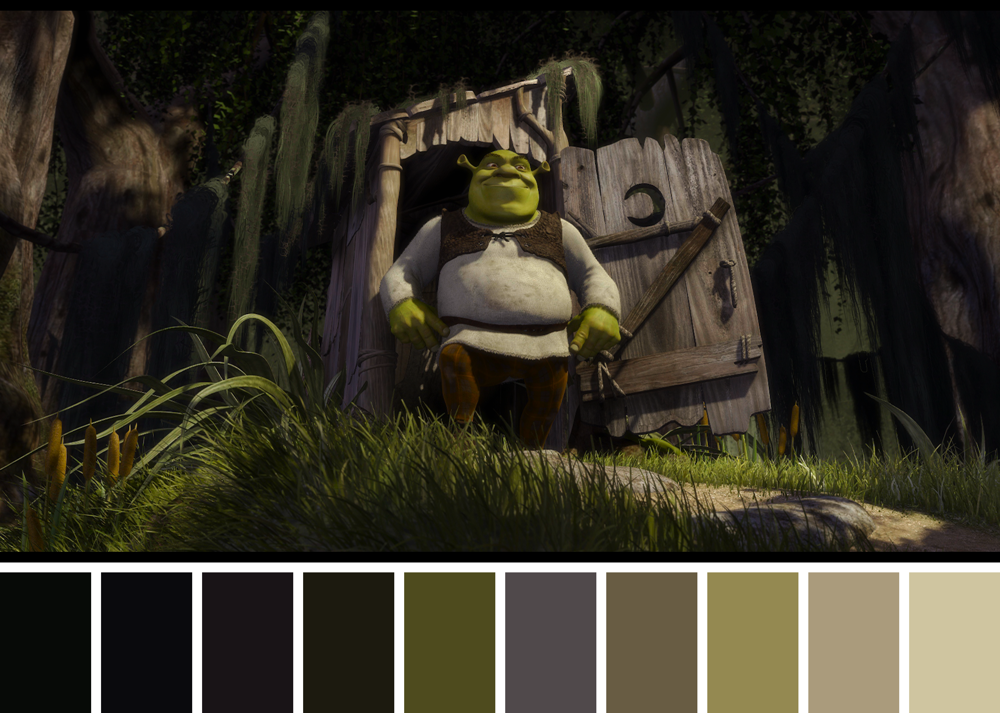

In [20]:
#Genero l'immagine finale
white_separator = Image.new(mode = "RGB", size = (int(white_sep_width/9), int(height/4)), color = "white")
palette = Image.new(mode = "RGB", size = (0, int(height/4)), color = "white")
for i in colors:
    #print_colors(i)
    color = Image.new(mode = "RGB", size = (white_sep_width, int(height/4)), color = i.rgb)
    palette = get_concat_h(palette, color)
    if missing_px > 0:
        color = Image.new(mode = "RGB", size = (1, int(height/4)), color = i.rgb)
        palette = get_concat_h(palette, color)
        missing_px = missing_px - 1
    palette = get_concat_h(palette, white_separator)
 
h_white = Image.new(mode = "RGB", size = (width, int(white_sep_width/9)), color = "white")
final = get_concat_v(image, h_white)
final = get_concat_v(final, palette)
final.save("Images/Palettes/image.png")
final